# Age and Gender classification
## Image Preprocessing Pattern Analysis

### Introduction

The goal of this notebook is to analyze the existing image dataset to identify the preprocessing techniques that were applied. By studying key aspects such as face positioning, image cropping, resizing, and zoom patterns, we aim to reverse-engineer the preprocessing pipeline. This process will allow us to ensure that new data follows the same preprocessing steps, maintaining consistency across the dataset and improving model performance.

In particular, we will focus on:

* Detecting if there is a standard face positioning (e.g., centering) within the images.
* Investigating if there are consistent distances between key landmarks (such as eyes).
* Understanding the cropping, zooming, and scaling techniques used to standardize face sizes within the dataset.

#### Environment Setup

In [42]:
import os 
import sys
sys.path
sys.path.append('..')
import shutil

import pandas as pd

from tqdm import tqdm

from utils import gender_labels, race_labels, age_group_labels

from utils import process_images_with_landmarks, gather_landmark_data
from utils import plot_multiple_normalized_landmarks, plot_eye_distance_distribution
from utils import plot_distance_distributions_and_bbox_scatter, plot_aspect_ratio_distribution
from utils import plot_face_size_distribution
from utils import gather_all_outliers, display_images_for_outliers, find_and_plot_outliers

#### Data Setup

In [2]:
path_data = '../data/UTKFace_cleaned'
path_labels = '../data/df_labels_recognized_final.csv'
df_labels = pd.read_csv(path_labels)

#### Visualy inspecting Model Capabilities

Processing images: 100%|█████████████████████████████████████████████████████████████| 100/100 [00:13<00:00,  7.39it/s]


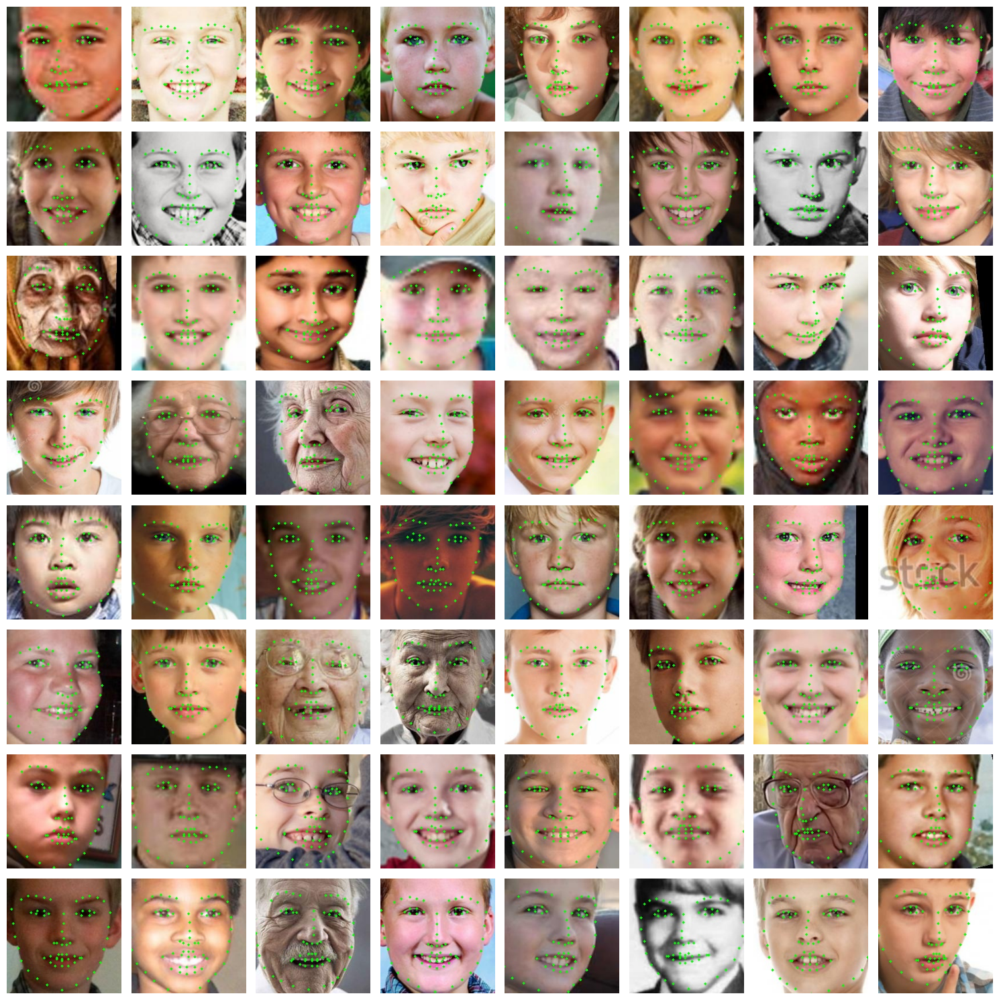

In [3]:
output_folder = "../data/processed_images_with_landmarks"
num_images_to_process = 100
num_samples_to_display = 64

process_images_with_landmarks(
    path_data,
    output_folder,
    num_images=num_images_to_process,
    num_samples=num_samples_to_display
    )

### Collecting Landmarks Data

In [4]:
landmarks_df = gather_landmark_data(df_labels, path_data, num_images=None)
print(landmarks_df.sample().T)

Processing images: 100%|█████████████████████████████████████████████████████████| 23545/23545 [13:37<00:00, 28.80it/s]

                                                         14750
filename                 39_0_0_20170117165645001.jpg.chip.jpg
bounding_box                        [58.0, 24.0, 213.0, 188.0]
left_eye                                          [69.0, 55.0]
right_eye                                        [138.0, 52.0]
nose                                             [72.0, 102.0]
left_mouth                                       [86.0, 144.0]
right_mouth                                     [130.0, 141.0]
distance_left                                             0.29
distance_top                                              0.12
distance_right                                          -0.065
distance_bottom                                           0.06
eye_distance                                         69.065186
eye_midpoint                                     (103.5, 53.5)
normalized_left_eye                             (0.345, 0.275)
normalized_right_eye                              (0.69

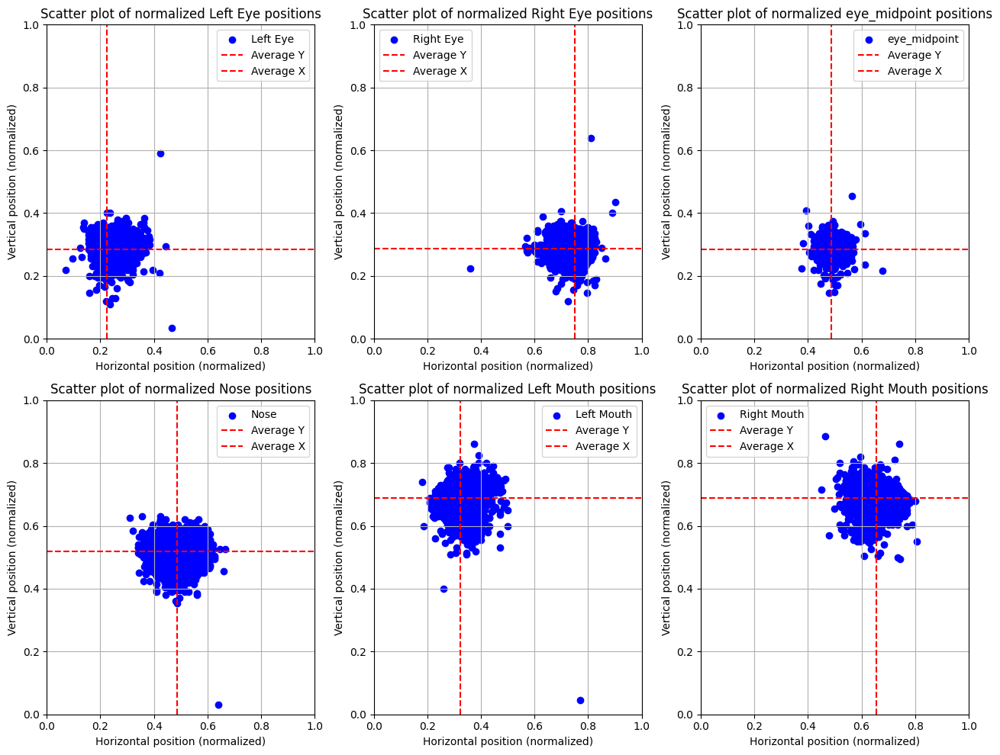

In [5]:
columns = ['normalized_left_eye', 'normalized_right_eye', 'normalized_eye_midpoint', 'normalized_nose', 
           'normalized_left_mouth', 'normalized_right_mouth']
labels = ['Left Eye', 'Right Eye', 'eye_midpoint', 'Nose', 'Left Mouth', 'Right Mouth']

plot_multiple_normalized_landmarks(landmarks_df, columns, labels)

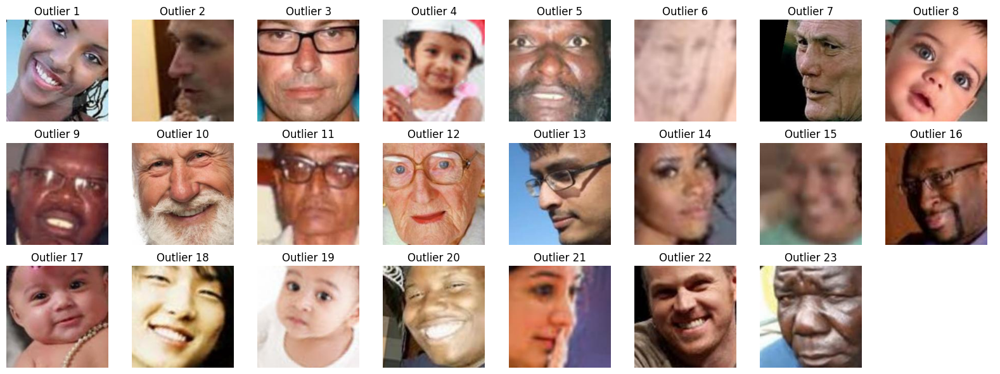

In [8]:
eps = 0.04
min_samples = 5

landmark_outliers_df = gather_all_outliers(landmarks_df, columns=columns, eps=eps, min_samples=min_samples)

display_images_for_outliers(landmark_outliers_df, folder_path=path_data, images_per_row=8)

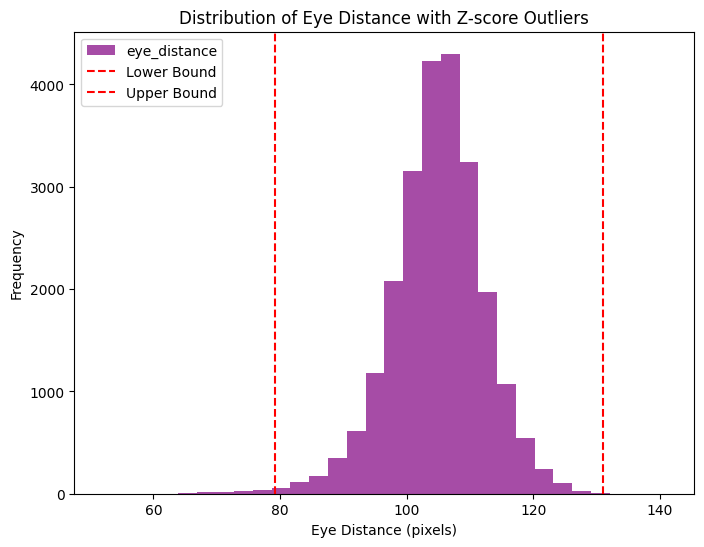

In [11]:
eye_d_outliers_df = find_and_plot_outliers(landmarks_df, column='eye_distance', threshold=3.5)

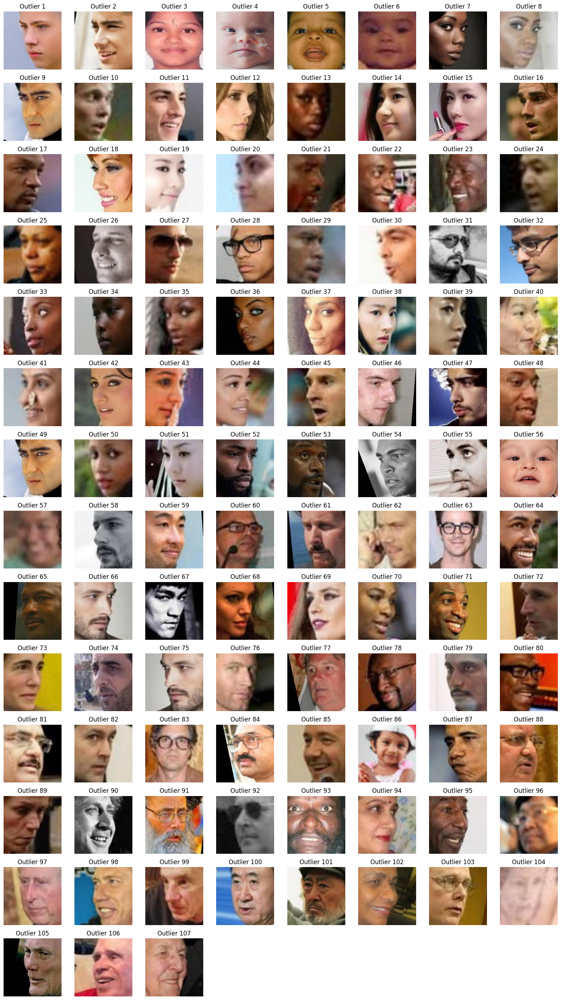

In [12]:
display_images_for_outliers(eye_d_outliers_df, folder_path=path_data, images_per_row=8)

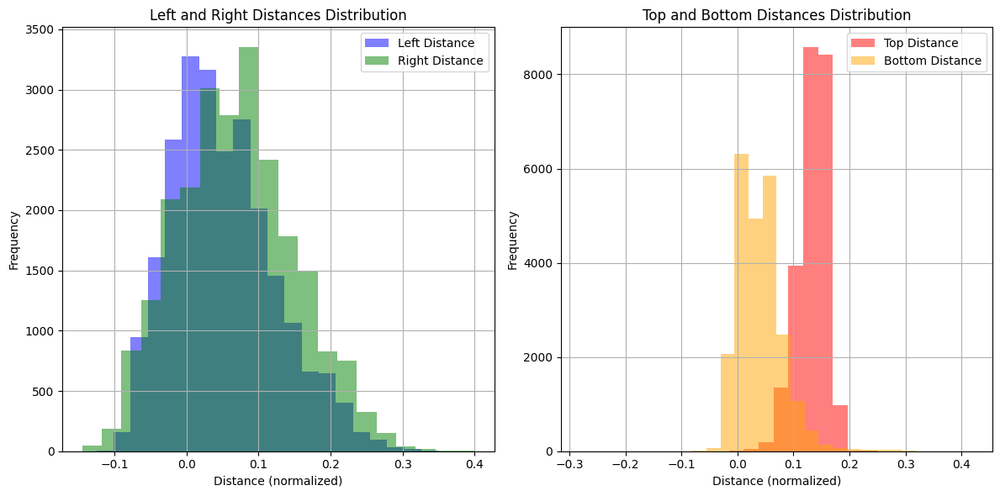

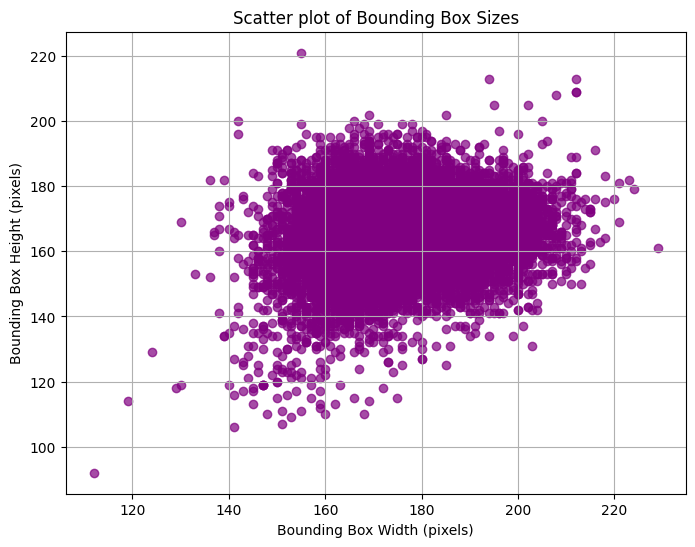

In [13]:
plot_distance_distributions_and_bbox_scatter(landmarks_df)

In [34]:
landmark_outliers_df_filenames = landmark_outliers_df['filename']

df_labels = df_labels[~df_labels['filename'].isin(landmark_outliers_df_filenames)]

landmarks_df = landmarks_df[~landmarks_df['filename'].isin(landmark_outliers_df_filenames)]

In [36]:
landmarks_output_path = '../data/cleaned_dataset_landmarks_df.csv'
landmarks_df.to_csv(landmarks_output_path, index=False)

print(f"DataFrame saved.")

DataFrame saved.


In [37]:
labels_output_path = '../data/cleaned_dataset_labels_df.csv'
df_labels.to_csv(labels_output_path, index=False)

print(f"DataFrame saved.")

DataFrame saved.


### Conclusion

After analyzing the facial landmark distributions and bounding box characteristics in our dataset, we have drawn the following conclusions to ensure proper alignment of new images:

* Horizontal Alignment Using Eye Midpoint: The scatter plots of left and right eye positions, as well as the midpoint between the eyes, show a relatively tight cluster, making the midpoint between the eyes a reliable reference for centering the face horizontally. This will ensure that the faces in new images are aligned consistently with those in the dataset.

* Vertical Alignment Using Bounding Box: The bounding box sizes for the faces, especially their heights, display a stable distribution across the dataset. This consistency makes the bounding box height an ideal feature for vertically aligning faces in the new images. By ensuring that the faces occupy a similar vertical position across all images, we can minimize variation in face size and location, leading to better model performance.

In conclusion, to align new images effectively and integrate them into the existing dataset, we should:

* Center the face horizontally using the midpoint between the eyes.
* Align the face vertically based on the bounding box height to ensure consistency in facial placement and size.
* 
By following this approach, the new images will match the format and structure of our dataset, improving the model's ability to generalize effectively

In [43]:
destination_folder = '../data/cleaned_dataset_UTKFace'
if not os.path.exists(destination_folder):
    os.makedirs(destination_folder)

source_folder = '../data/original/inner/UTKFace'

for filename in tqdm(df_labels['filename'], desc="Copying files", unit="file"):
    source_file_path = os.path.join(source_folder, filename)
    destination_file_path = os.path.join(destination_folder, filename)

    if os.path.exists(source_file_path):
        shutil.copy(source_file_path, destination_file_path)

Copying files: 100%|██████████████████████████████████████████████████████████| 23522/23522 [00:26<00:00, 895.39file/s]
